<a href="https://colab.research.google.com/github/Shiven004/End_to_End_ML_Projects/blob/master/zerotogbms_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Stay Alert! The Ford Challenge

Driving while distracted, fatigued or drowsy may lead to accidents. Activities that divert the driver's attention from the road ahead, such as engaging in a conversation with other passengers in the car, making or receiving phone calls, sending or receiving text messages, eating while driving or events outside the car may cause driver distraction. Fatigue and drowsiness can result from driving long hours or from lack of sleep.

The objective of this challenge is to design a detector/classifier that will detect whether the driver is alert or not alert, employing any combination of vehicular, environmental and driver physiological data that are acquired while driving.



The winner receives free registration to the 2011 International Joint Conference on Neural Networks (San Jose, California July 31 - August 5, 2011), which is valued at $950. The winner will also be invited to present their solution at the conference.

![](https://media.ford.com/content/dam/fordmedia/North%20America/US/2015/01/06/ford-smart-mobility-logo.jpg/jcr:content/renditions/cq5dam.web.881.495.jpeg)


The following steps will be used in the execution of this project:

- Downloading a real-world dataset from a Kaggle competition.
- Performing feature engineering and prepare the dataset for training.
- Training and interpreting a gradient boosting model using XGBoost.
- Training with KFold cross validation and ensembling results.
- Configuring the gradient boosting model and tuning hyperparamters.






In [1]:
# Jovian Commit Essentials
# Please retain and execute this cell without modifying the contents for `jovian.commit` to work
!pip install jovian --upgrade -q
import jovian
jovian.set_project('python-project-realworld-ml-model')
jovian.set_colab_id('1g6XJld4-IIEbEx2B3FdghLr7CIs45qP8')

     |████████████████████████████████| 68 kB 4.6 MB/s 


# python-project-realworld-ml-model

Use the "Run" button to execute the code.

In [2]:
!pip install jovian --upgrade --quiet

In [3]:
import jovian

In [4]:
!pip install numpy pandas matplotlib seaborn --quiet

In [5]:
!pip install jovian opendatasets xgboost graphviz lightgbm scikit-learn xgboost lightgbm --upgrade --quiet

     |████████████████████████████████| 166.7 MB 14 kB/s 
     |████████████████████████████████| 2.0 MB 46.1 MB/s 
     |████████████████████████████████| 22.3 MB 1.3 MB/s 


## Downloading the Data

We can download the dataset from Kaggle directly within the Jupyter notebook using the `opendatasets` library. 

In [6]:
#https://www.kaggle.com/c/stayalert
import os
import opendatasets as od
import pandas as pd
pd.set_option("display.max_columns", 120)
pd.set_option("display.max_rows", 120)

In [7]:
od.download('https://www.kaggle.com/c/stayalert')

 27%|██▋       | 5.00M/18.2M [00:00<00:00, 39.7MB/s]

100%|██████████| 18.2M/18.2M [00:00<00:00, 69.5MB/s]



Extracting archive ./stayalert/stayalert.zip to ./stayalert


In [8]:
os.listdir('stayalert')

['fordTest.csv', 'fordTrain.csv', 'example_submission.csv', 'Solution.csv']

In [9]:
train_df = pd.read_csv('./stayalert/fordTrain.csv', low_memory=False)
solution_df = pd.read_csv('./stayalert/Solution.csv')
test_df = pd.read_csv('./stayalert/fordTest.csv')
submission_df = pd.read_csv('./stayalert/example_submission.csv')

In [10]:
train_df.head()

,TrialID,ObsNum,IsAlert,P1,P2,P3,P4,P5,P6,P7,P8,E1,E2,E3,E4,E5,E6,E7,E8,E9,E10,E11,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11
0,0,0,0,34.7406,9.84593,1400,42.8571,0.290601,572,104.895,0,0.0,0.0,1,-20,0.015875,324,1,1,1,57,0.0,101.96,0.175,752,5.99375,0,2005,0,13.4,0,4,14.8004
1,0,1,0,34.4215,13.41120,1400,42.8571,0.290601,572,104.895,0,0.0,0.0,1,-20,0.015875,324,1,1,1,57,0.0,101.98,0.455,752,5.99375,0,2007,0,13.4,0,4,14.7729
2,0,2,0,34.3447,15.18520,1400,42.8571,0.290601,576,104.167,0,0.0,0.0,1,-20,0.015875,324,1,1,1,57,0.0,101.97,0.280,752,5.99375,0,2011,0,13.4,0,4,14.7736
3,0,3,0,34.3421,8.84696,1400,42.8571,0.290601,576,104.167,0,0.0,0.0,1,-20,0.015875,324,1,1,1,57,0.0,101.99,0.070,752,5.99375,0,2015,0,13.4,0,4,14.7667
4,0,4,0,34.3322,14.69940,1400,42.8571,0.290601,576,104.167,0,0.0,0.0,1,-20,0.015875,324,1,1,1,57,0.0,102.07,0.175,752,5.99375,0,2017,0,13.4,0,4,14.7757


In [11]:
solution_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120840 entries, 0 to 120839
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   TrialID     120840 non-null  int64 
 1   ObsNum      120840 non-null  int64 
 2   Prediction  120840 non-null  int64 
 3   Indicator   120840 non-null  object
dtypes: int64(3), object(1)
memory usage: 3.7+ MB


In [12]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120840 entries, 0 to 120839
Data columns (total 33 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   TrialID  120840 non-null  int64  
 1   ObsNum   120840 non-null  int64  
 2   IsAlert  120840 non-null  object 
 3   P1       120840 non-null  float64
 4   P2       120840 non-null  float64
 5   P3       120840 non-null  int64  
 6   P4       120840 non-null  float64
 7   P5       120840 non-null  float64
 8   P6       120840 non-null  int64  
 9   P7       120840 non-null  float64
 10  P8       120840 non-null  int64  
 11  E1       120840 non-null  float64
 12  E2       120840 non-null  float64
 13  E3       120840 non-null  int64  
 14  E4       120840 non-null  int64  
 15  E5       120840 non-null  float64
 16  E6       120840 non-null  int64  
 17  E7       120840 non-null  int64  
 18  E8       120840 non-null  int64  
 19  E9       120840 non-null  int64  
 20  E10      120840 non-null  

# Data description
The data for this challenge shows the results of a number of "trials", each one representing about 2 minutes of sequential data that are recorded every 100 ms during a driving session on the road or in a driving simulator.  The trials are samples from some 100 drivers of both genders, and of different ages and ethnic backgrounds. The files are structured as follows:

The first column is the Trial ID - each period of around 2 minutes of sequential data has a unique trial ID. For instance, the first 1210 observations represent sequential observations every 100ms, and therefore all have the same trial ID
The second column is the observation number - this is a sequentially increasing number within one trial ID
The third column has a value X for each row where
               X = 1     if the driver is alert
               X = 0     if the driver is not alert
The next 8 columns with headers P1, P2 , …….., P8  represent physiological data;
The next 11 columns with headers E1, E2, …….., E11  represent environmental data;
The next 11 columns with headers V1, V2, …….., V11  represent vehicular  data;

The third column values are hidden in the test set ('fordTest.csv').

The file 'example_submission.csv' is an example of a submission file - your submission files should be in exactly the same format, with only values in the last column ('Prediction') different. Predictions are expected to be real numbers between 0 and 1 inclusive.
 
Note:  The actual names and measurement units of the physiological, environmental and vehicular data are not disclosed in this challenge. Models which use fewer physiological variables (columns with names starting with 'P') are of particular interest, therefore competitors are encouraged to consider models which require fewer of these variables.



# Exploratory Data Analysis and Visualization

In [13]:
!pip install plotly matplotlib seaborn --quiet

In [14]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

In [15]:
px.histogram(train_df,x='P1',title='Physiological-P1  vs. IsAlert',color='IsAlert')

In [16]:
px.histogram(train_df,x='V2',title='Vehicular factor(V2)  vs. Driver Alertness',color='IsAlert')

In [17]:
px.histogram(train_df,x='E9',title='Environmental factor(E9)  vs. Driver Alertness',color='IsAlert')

In [18]:
px.scatter(train_df.sample(60000), 
           title='Physiological. vs Driver Alertness.',
           x='P1',
           y='P2',          
           color='IsAlert')

In [19]:
px.scatter(train_df.sample(60000), 
           title='Environment. vs Driver Alertness.',
           x='E1',
           y='E2',          
           color='IsAlert')

#Identifying Input and Target Columns

Often, not all the columns in a dataset are useful for training a model. In the current dataset, we can ignore the Date column, since we only want to weather conditions to make a prediction about whether it will rain the next day.

Let's create a list of input columns, and also identify the target column.


In [20]:
#Before proceeding,make a copy of df and move the target column to the last column in dataframe.
train_df_copy = train_df.copy()
test_df_copy = test_df.copy()
# now, moving the target col as the last col in df to make segregation easy.
train_df_copy = train_df_copy.drop(columns=['IsAlert']).assign(IsAlert=train_df_copy['IsAlert'])
test_df_copy = test_df_copy.drop(columns=['IsAlert']).assign(IsAlert=test_df_copy['IsAlert'])

In [21]:
input_cols = list(train_df_copy.columns)[2:-1]
target_col = 'IsAlert'
print('input_cols:: ', input_cols)
print('target_col:: ', target_col)

input_cols::  ['P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'E1', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11']
target_col::  IsAlert


In [22]:
inputs = train_df_copy[input_cols].copy()
targets = train_df_copy[target_col].copy()

In [23]:
!pip install numpy --quiet

In [24]:
import numpy as np

In [25]:
numeric_cols = inputs.select_dtypes(include=np.number).columns.tolist()[:]

In [26]:
#Since there is no missing data, we dont need Imputing Missing Numeric Data.
inputs[numeric_cols].isna().sum()

P1     0
P2     0
P3     0
P4     0
P5     0
P6     0
P7     0
P8     0
E1     0
E2     0
E3     0
E4     0
E5     0
E6     0
E7     0
E8     0
E9     0
E10    0
E11    0
V1     0
V2     0
V3     0
V4     0
V5     0
V6     0
V7     0
V8     0
V9     0
V10    0
V11    0
dtype: int64

## Scaling Numeric Features

Another good practice is to scale numeric features to a small range of values e.g. $(0,1)$ or $(-1,1)$. Scaling numeric features ensures that no particular feature has a disproportionate impact on the model's loss. Optimization algorithms also work better in practice with smaller numbers.

The numeric columns in our dataset have varying ranges.

In [27]:
inputs[numeric_cols].describe()

,P1,P2,P3,P4,P5,P6,P7,P8,E1,E2,E3,E4,E5,E6,E7,E8,E9,E10,E11,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11
count,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.0,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.000000,604329.0,604329.000000,604329.0,604329.000000,604329.000000
mean,35.449020,11.996525,1026.671035,64.061965,0.178923,845.384610,77.887628,0.0,10.512332,102.790045,0.290565,-4.230136,0.016262,358.674738,1.757296,1.383058,0.876787,63.311256,1.315265,76.965412,-0.037710,573.786433,19.961030,0.179814,1715.688383,0.0,12.710354,0.0,3.312257,11.668277
std,7.484629,3.760292,309.277877,19.755950,0.372309,2505.335141,18.577930,0.0,14.049071,127.258629,1.006162,35.508596,0.002304,27.399973,2.854852,1.608807,0.328681,18.891029,5.247204,44.387031,0.403896,298.412888,63.269456,0.384033,618.176470,0.0,11.532085,0.0,1.243586,9.934423
min,-22.481200,-45.629200,504.000000,23.885300,0.038920,128.000000,0.262224,0.0,0.000000,0.000000,0.000000,-250.000000,0.008000,260.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-4.795000,240.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,1.000000,1.676730
25%,31.758100,9.903540,792.000000,49.180300,0.092110,668.000000,66.666700,0.0,0.000000,0.000000,0.000000,-8.000000,0.015686,348.000000,0.000000,0.000000,1.000000,52.000000,0.000000,41.930000,-0.175000,255.000000,1.487500,0.000000,1259.000000,0.0,0.000000,0.0,3.000000,7.947680
50%,34.145100,11.400400,1000.000000,60.000000,0.105083,800.000000,75.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.016001,365.000000,1.000000,1.000000,1.000000,67.000000,0.000000,100.400000,0.000000,511.000000,3.018750,0.000000,1994.000000,0.0,12.800000,0.0,4.000000,10.772600
75%,37.311900,13.644200,1220.000000,75.757600,0.138814,900.000000,89.820400,0.0,28.240000,211.584000,0.000000,6.000000,0.016694,367.000000,2.000000,2.000000,1.000000,73.000000,0.000000,108.500000,0.070000,767.000000,7.481250,0.000000,2146.000000,0.0,21.900000,0.0,4.000000,15.270900
max,101.351000,71.173700,2512.000000,119.048000,27.202200,228812.000000,468.750000,0.0,243.991000,359.995000,4.000000,260.000000,0.023939,513.000000,25.000000,9.000000,1.000000,127.000000,52.400000,129.700000,3.990000,1023.000000,484.488000,1.000000,4892.000000,0.0,82.100000,0.0,7.000000,262.534000


In [28]:
from sklearn.preprocessing import MinMaxScaler

In [29]:
scaler = MinMaxScaler().fit(inputs[numeric_cols])

In [30]:
inputs[numeric_cols] = scaler.transform(inputs[numeric_cols])

## Gradient Boosting Classifier

We're now ready to train our gradient boosting machine (GBM) model. Here's how a GBM model works:

1. The average value of the target column and uses as an initial prediction every input.
2. The residuals (difference) of the predictions with the targets are computed.
3. A decision tree of limited depth is trained to **predict just the residuals** for each input.
4. Predictions from the decision tree are scaled using a parameter called the learning rate (this prevents overfitting)
5. Scaled predictions fro the tree are added to the previous predictions to obtain the new and improved predictions.
6. Steps 2 to 5 are repeated to create new decision trees, each of which is trained to predict just the residuals from the previous prediction.

The term "gradient" refers to the fact that each decision tree is trained with the purpose of reducing the loss from the previous iteration (similar to gradient descent). The term "boosting" refers the general technique of training new models to improve the results of an existing model. 



For a mathematical explanation of gradient boosting, check out the following resources:

- [XGBoost Documentation](https://xgboost.readthedocs.io/en/latest/tutorials/model.html)
- [Video Tutorials on StatQuest](https://www.youtube.com/watch?v=3CC4N4z3GJc&list=PLblh5JKOoLUJjeXUvUE0maghNuY2_5fY6)

Here's a visual representation of gradient boosting:

![](https://miro.medium.com/max/560/1*85QHtH-49U7ozPpmA5cAaw.png)



In [31]:
#Split data in train and test sets respectovely, as test.csv has wrong target values(i.e.?)
from sklearn.model_selection import train_test_split
X_train, X_test, train_targets, test_targets = train_test_split(inputs, targets,train_size=0.75, test_size=0.25)

### Training

To train a GBM, we can use the `XGBRegressor` class from the [`XGBoost`](https://xgboost.readthedocs.io/en/latest/) library.

In [32]:
from xgboost.sklearn import XGBClassifier
import warnings
warnings.filterwarnings('ignore')

In [33]:
model = XGBClassifier(random_state=42, 
                           n_jobs=-1, n_estimators=20, 
                           max_depth=4, eval_metric='mlogloss')

In [34]:
%%time
model.fit(X_train,train_targets)

CPU times: user 24.9 s, sys: 118 ms, total: 25 s
Wall time: 13.3 s


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='mlogloss',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=4, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=20, n_jobs=-1,
              num_parallel_tree=1, random_state=42, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [35]:
preds = model.predict(X_test)
preds

array([1, 1, 1, ..., 1, 1, 1])

In [36]:
from sklearn.metrics import mean_squared_error
def rmse(a, b):
    return mean_squared_error(a, b, squared=False)

In [37]:
loss = rmse(preds,test_targets)
print('RMSE loss is :: ',loss)

RMSE loss is ::  0.32831148955214046


In [38]:
acc = model.score(X_test,test_targets)
print(f'Model accuracy is :: {acc * 100 : 0.2f}%')

Model accuracy is ::  89.22%


## Visualization

We can visualize individual trees using plot_tree (note: this requires the graphviz library to be installed).


In [39]:
import matplotlib.pyplot as plt
from xgboost import plot_tree
from matplotlib.pylab import rcParams
%matplotlib inline

rcParams['figure.figsize'] = 30,30

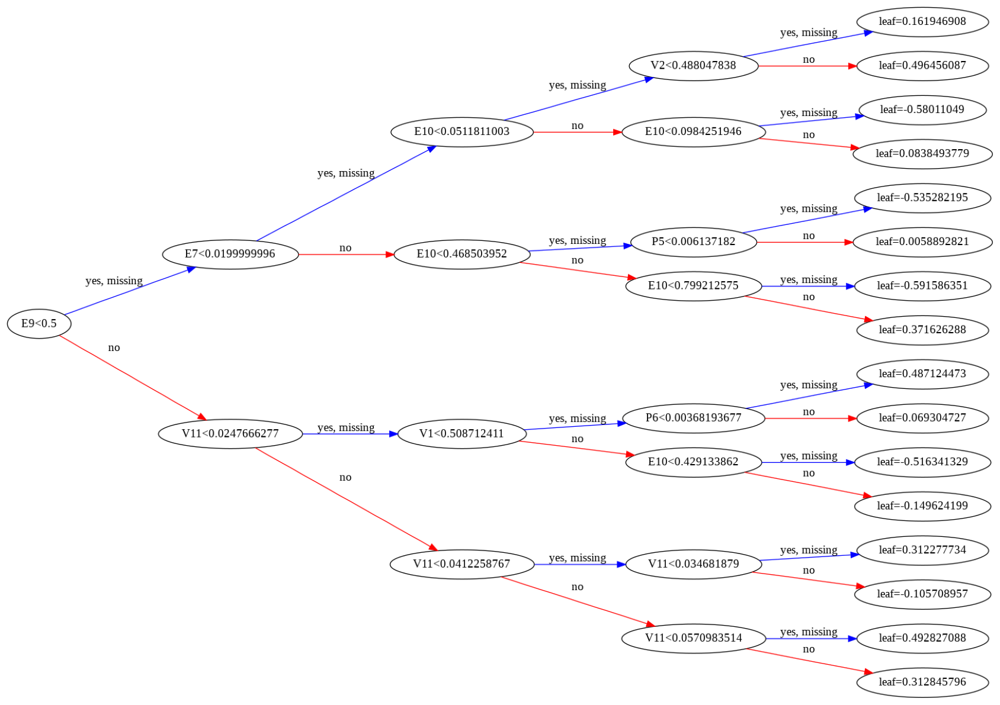

In [40]:
plot_tree(model, rankdir='LR');

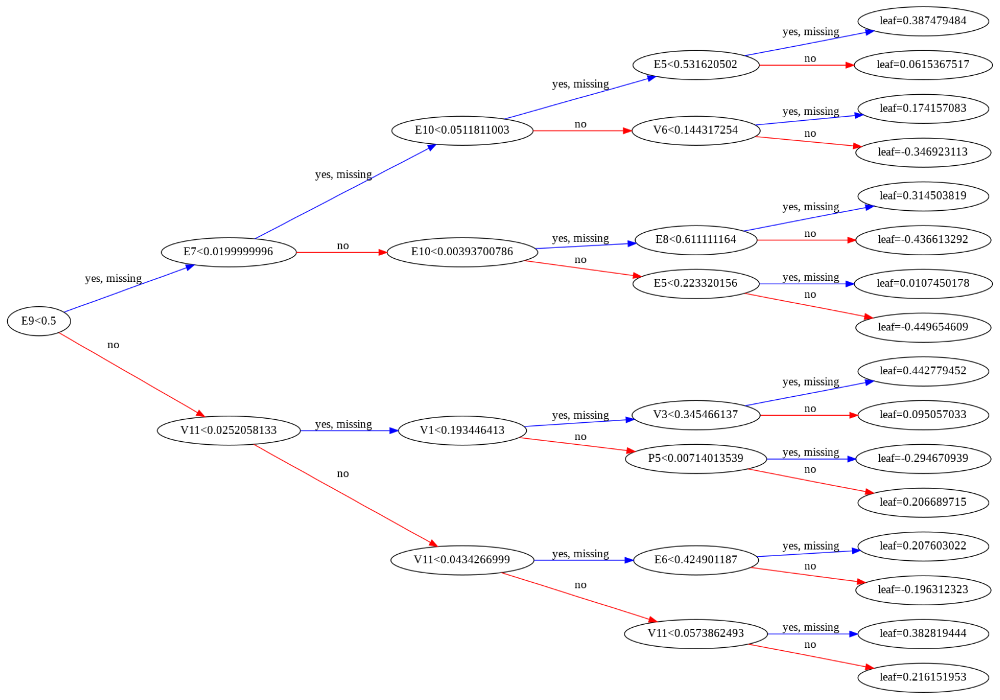

In [41]:
plot_tree(model, rankdir='LR', num_trees=1);

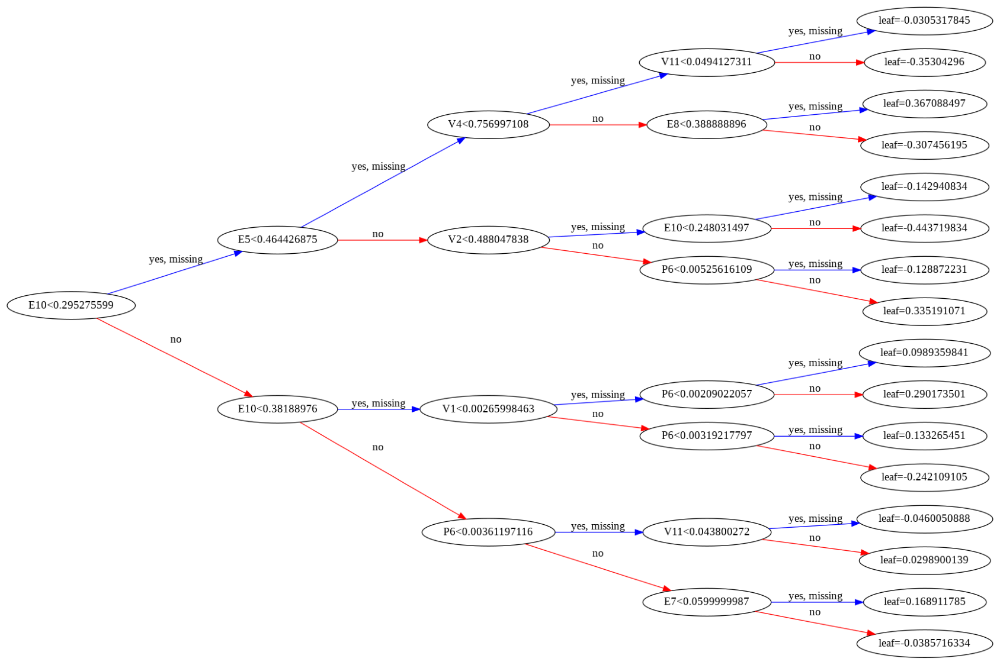

In [42]:
plot_tree(model, rankdir='LR', num_trees=19);

### Feature importance

Just like decision trees and random forests, XGBoost also provides a feature importance score for each column in the input.

In [43]:
importance_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

In [44]:
importance_df.head(10)

,feature,importance
16,E9,0.308467
29,V11,0.105210
19,V1,0.069880
14,E7,0.057047
13,E6,0.048536
9,E2,0.048357
22,V4,0.039984
10,E3,0.039345
15,E8,0.038817
4,P5,0.037995


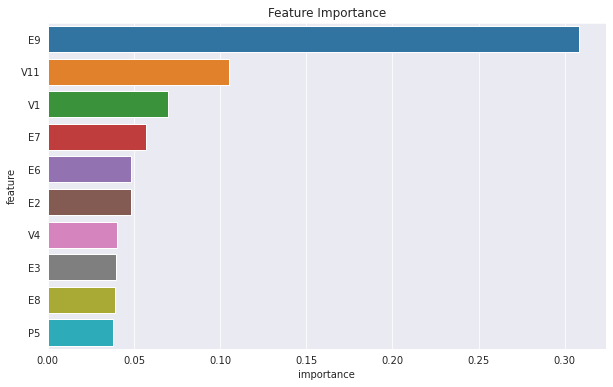

In [45]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

## Hyperparameter Tuning and Regularization

Just like other machine learning models, there are several hyperparameters we can to adjust the capacity of model and reduce overfitting.

<img src="https://i.imgur.com/EJCrSZw.png" width="480">


In [46]:
model

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='mlogloss',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=4, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=20, n_jobs=-1,
              num_parallel_tree=1, random_state=42, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              validate_parameters=1, verbosity=None)

Here's a helper function to test hyperparameters with K-fold cross validation.

In [47]:
X_val, val_targets = X_test, test_targets

In [48]:
def test_params(**params):
    model = XGBClassifier(random_state=42,eval_metric='mlogloss', **params)
    model.fit(X_train, train_targets)
    train_rmse = rmse(model.predict(X_train), train_targets)
    val_rmse = rmse(model.predict(X_val), val_targets)
    print('Train RMSE: {}, Validation RMSE: {}'.format(train_rmse, val_rmse))

#### `n_estimators`

The number of trees to be created. More trees = greater capacity of the model.


In [49]:
test_params(n_estimators=10)

Train RMSE: 0.3222350768763498, Validation RMSE: 0.32509018879676427


In [50]:
test_params(n_estimators=15)

Train RMSE: 0.30491604333127986, Validation RMSE: 0.30749093879690287


In [51]:
test_params(n_estimators=20)

Train RMSE: 0.2849422959299192, Validation RMSE: 0.2870397148234548


In [52]:
#test_params(n_estimators=45) O/P: Train RMSE: 0.24570633864579036, Validation RMSE: 0.25160338894706646
#test_params(n_estimators=50) O/P: Train RMSE: 0.24101468598335526, Validation RMSE: 0.24691210426859936
#test_params(n_estimators=60) O/P: Train RMSE: 0.23123369371614938, Validation RMSE: 0.23865380118687027
#test_params(n_estimators=70) O/P: Train RMSE: 0.22580808563824087, Validation RMSE: 0.23331296356658746
#test_params(n_estimators=90) O/P: Train RMSE: 0.2159787256164789, Validation RMSE: 0.22457965191723808
#test_params(n_estimators=100)O/P: Train RMSE: 0.21099597444404275, Validation RMSE: 0.22002667957040664

#### `max_depth`

As you increase the max depth of each tree, the capacity of the tree increases and it can capture more information about the training set.

In [53]:
test_params(max_depth=3)

Train RMSE: 0.29709515901002215, Validation RMSE: 0.29835766309777834


In [54]:
test_params(max_depth=4)

Train RMSE: 0.263110826507242, Validation RMSE: 0.2667574953037721


In [55]:
#test_params(max_depth=7)  O/P: Train RMSE: 0.18048413199370184, Validation RMSE: 0.19278258483192626
#test_params(max_depth=9)  O/P: Train RMSE: 0.1234889043236381, Validation RMSE: 0.15189596173104675
#test_params(max_depth=13) O/P: Train RMSE: 0.053216073255047396, Validation RMSE: 0.11179754026507747
#test_params(max_depth=17) O/P: Train RMSE: 0.0, Validation RMSE: 0.07511732476557229
#test_params(max_depth=19) O/P: Train RMSE: 0.0, Validation RMSE: 0.07076935215252626 

#### `learning_rate`

The scaling factor to be applied to the prediction of each tree. A very high learning rate (close to 1) will lead to overfitting, and a low learning rate (close to 0) will lead to underfitting.

In [56]:
test_params(n_estimators=10, learning_rate=0.01)

Train RMSE: 0.3628943122942034, Validation RMSE: 0.3641918499275839


In [57]:
#test_params(learning_rate=0.300000012) O/P: Train RMSE: 0.20902050818887022, Validation RMSE: 0.21581240672846186

#### `booster`

Instead of using Decision Trees, XGBoost can also train a linear model for each iteration. This can be configured using `booster`.

In [58]:
test_params(booster='gblinear')

Train RMSE: 0.4625282585056752, Validation RMSE: 0.46320358491240127


## Putting it Together and Making Predictions

Let's train a final model on the entire training set with custom hyperparameters. 

In [59]:
#Perform House cleaning and delete previously used model object
del model

In [60]:
model = XGBClassifier(random_state=42,n_jobs=-1, 
                      n_estimators=50,max_depth=13, 
                      eval_metric='mlogloss')

In [61]:
%%time
model.fit(X_train,train_targets)

CPU times: user 3min 54s, sys: 223 ms, total: 3min 54s
Wall time: 2min 2s


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='mlogloss',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=13, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=50, n_jobs=-1,
              num_parallel_tree=1, random_state=42, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [62]:
test_preds = model.predict(X_test)
print(f'Training accuracy is : {model.score(X_train,train_targets) * 100 :0.2f}%')
print(f'Testing accuracy is : {model.score(X_val,val_targets) * 100 :0.2f}%')

Training accuracy is : 99.49%
Testing accuracy is : 98.63%


In [63]:
solution_df['IsAlert']  = test_preds[:120840]

In [64]:
solution_df.to_csv('submission.csv', index=None)

## Saving and Loading Trained Models

We can save the parameters (weights and biases) of our trained model to disk, so that we needn't retrain the model from scratch each time we wish to use it. Along with the model, it's also important to save imputers, scalers, encoders and even column names. Anything that will be required while generating predictions using the model should be saved.

We can use the `joblib` module to save and load Python objects on the disk. 

In [65]:
def predict_input(model, single_input):
    X_input = pd.DataFrame([single_input])    
    pred = model.predict(X_input)[0]    
    return 'Alert' if pred == 1 else 'Not Alert'

In [66]:
new_input = {
              'P1':53.9192, 
              'P2':7.70628, 
              'P3':800, 
              'P4':75.0,
              'P5':0.259465, 
              'P6':1124,
              'P7':53.3808, 
              'P8':0, 
              'E1':0.0, 
              'E2':0.0, 
              'E3':0, 
              'E4':0, 
              'E5':0.014174, 
              'E6':367, 
              'E7':0, 
              'E8':0, 
              'E9':1, 
              'E10':31,
              'E11':0.0,
              'V1':0.0, 
              'V2':-0.56, 
              'V3':752, 
              'V4':17.9812, 
              'V5':0, 
              'V6':648, 
              'V7':0, 
              'V8':0.0, 
              'V9':0, 
              'V10':1,
              'V11':14.3835                
            }

In [67]:
pred = predict_input(model, new_input)
print('Prediction for single input is : {}'.format(pred))

Prediction for single input is : Alert


In [68]:
import joblib
from sklearn.metrics import accuracy_score, confusion_matrix

In [69]:
driver_alert = {
    'model': model,    
    'scaler': scaler,    
    'input_cols': input_cols,
    'target_col': target_col,
    'numeric_cols': numeric_cols    
}

In [70]:
joblib.dump(driver_alert, 'driver_alert.joblib')

['driver_alert.joblib']

In [71]:
driver_alert_02 = joblib.load('driver_alert.joblib')

In [72]:
test_preds2 = driver_alert_02['model'].predict(X_test)
accuracy_score(test_targets, test_preds2)
print(f'Test Accuracy for Single Input : {accuracy_score(test_targets, test_preds2) * 100 :0.2f}%')

Test Accuracy for Single Input : 98.63%


In [73]:
# Execute this to save new versions of the notebook
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Please enter your API key ( from https://jovian.ai/ ):
API KEY: ··········
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/shivenderkhajuria/python-project-realworld-ml-model


'https://jovian.ai/shivenderkhajuria/python-project-realworld-ml-model'

## Summary and References

The following topics were covered in this real word project:

- Downloading a real-world dataset
- Preparing a dataset for training
- Training and interpreting decision trees
- Training and interpreting random forests
- Overfitting, hyperparameter tuning & regularization
- Making predictions on single inputs



Following concepts were also covered the following terms:

* XGBClassifier
* Overfitting
* Hyperparameter
* Hyperparameter tuning
* Regularization
* Ensembling
* Generalization

Check out the following resources to learn more:
- https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html
- https://xgboost.readthedocs.io/en/latest/python/python_api.html#xgboost.XGBClassifier
- https://www.kaggle.com/c/stayalert/data




## Make a Submission

To make a submission, just execute the following cell:

In [75]:
jovian.submit(assignment="zerotogbms-project")

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/shivenderkhajuria/python-project-realworld-ml-model
[jovian] Submitting assignment..
[jovian] Verify your submission at https://jovian.ai/learn/machine-learning-with-python-zero-to-gbms/assignment/course-project-real-world-machine-learning-model
